In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport
import seaborn as sns
import plotly.express as px

In [2]:
df = pd.read_csv('dataset/country_vaccinations.csv')
#df2 = pd.read_csv('dataset/country_vaccinations_by_manufacturer.csv')

In [3]:
df.head()

,country,iso_code,date,total_vaccinations,people_vaccinated,people_fully_vaccinated,daily_vaccinations_raw,daily_vaccinations,total_vaccinations_per_hundred,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,daily_vaccinations_per_million,vaccines,source_name,source_website
0,Afghanistan,AFG,2021-02-22,0.0,0.0,NaN,NaN,NaN,0.0,0.0,NaN,NaN,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/
1,Afghanistan,AFG,2021-02-23,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,34.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/
2,Afghanistan,AFG,2021-02-24,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,34.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/
3,Afghanistan,AFG,2021-02-25,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,34.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/
4,Afghanistan,AFG,2021-02-26,NaN,NaN,NaN,NaN,1367.0,NaN,NaN,NaN,34.0,"Johnson&Johnson, Oxford/AstraZeneca, Pfizer/Bi...",World Health Organization,https://covid19.who.int/


In [4]:
##### Data Cleaning #####
#report = ProfileReport(df)
#report

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 86512 entries, 0 to 86511
Data columns (total 15 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   country                              86512 non-null  object 
 1   iso_code                             86512 non-null  object 
 2   date                                 86512 non-null  object 
 3   total_vaccinations                   43607 non-null  float64
 4   people_vaccinated                    41294 non-null  float64
 5   people_fully_vaccinated              38802 non-null  float64
 6   daily_vaccinations_raw               35362 non-null  float64
 7   daily_vaccinations                   86213 non-null  float64
 8   total_vaccinations_per_hundred       43607 non-null  float64
 9   people_vaccinated_per_hundred        41294 non-null  float64
 10  people_fully_vaccinated_per_hundred  38802 non-null  float64
 11  daily_vaccinations_per_milli

In [6]:
df.shape

(86512, 15)

In [7]:
###### Dealing with misssing values #####
df.isna().sum()

country                                    0
iso_code                                   0
date                                       0
total_vaccinations                     42905
people_vaccinated                      45218
people_fully_vaccinated                47710
daily_vaccinations_raw                 51150
daily_vaccinations                       299
total_vaccinations_per_hundred         42905
people_vaccinated_per_hundred          45218
people_fully_vaccinated_per_hundred    47710
daily_vaccinations_per_million           299
vaccines                                   0
source_name                                0
source_website                             0
dtype: int64

In [8]:
# drop na in 'total_vaccinations'
df = df.drop(df[df.total_vaccinations.isna()].index)

In [9]:
# drop na in 'people_vaccinated'
check_data = df.drop(df[df.people_vaccinated.isna()].index)

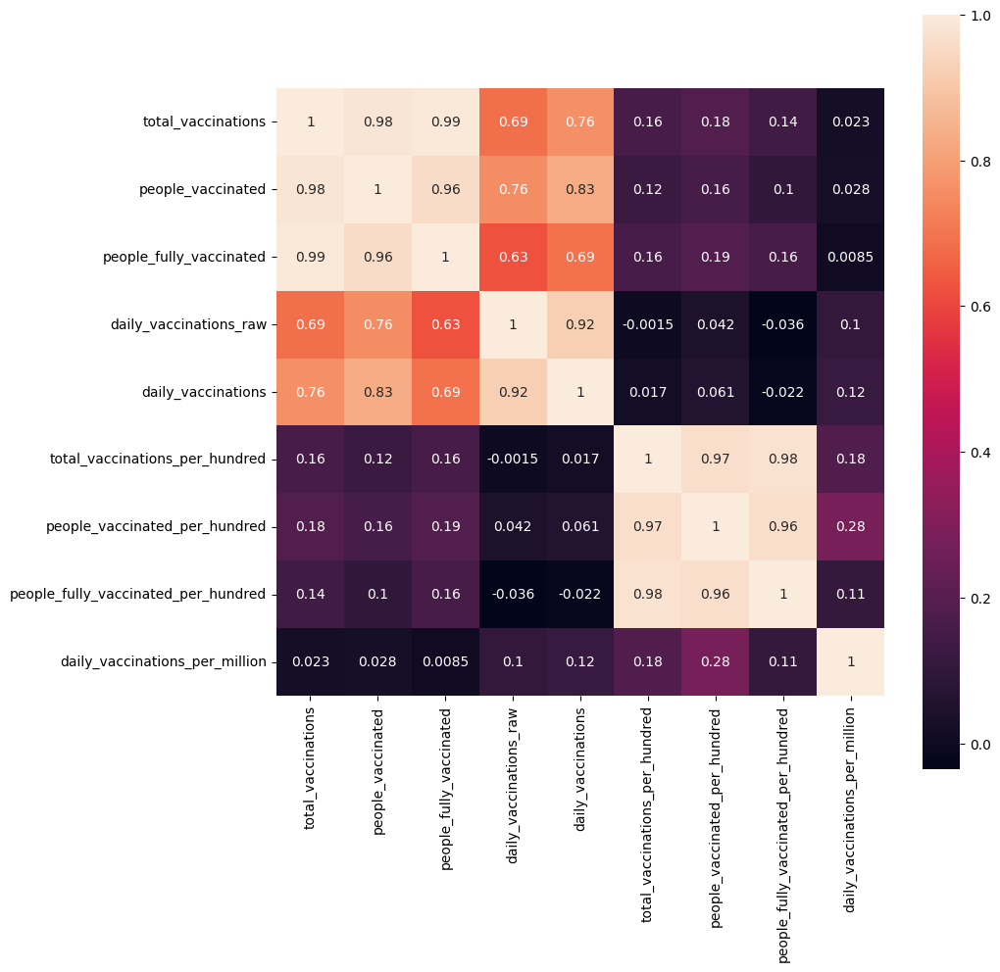

In [10]:
# looking at some correlation
plt.subplots(figsize=(10, 10))
sns.heatmap(check_data.corr(numeric_only=True), annot=True, square=True);

In [11]:
# people_vaccinated and people_vaccinated_per_hundred¶
diff = check_data.total_vaccinations.mean() - check_data.people_vaccinated.mean()
diff_per_hundred = check_data.total_vaccinations_per_hundred.mean() - check_data.people_vaccinated_per_hundred.mean()

df.people_vaccinated = df.people_vaccinated.fillna(df.total_vaccinations - diff)
df.people_vaccinated_per_hundred = df.people_vaccinated_per_hundred.fillna(df.total_vaccinations_per_hundred - diff_per_hundred)

In [12]:
# daily_vaccinations_raw and daily_vaccinations
diff = check_data.daily_vaccinations.mean() - check_data.daily_vaccinations_raw.mean()
df.daily_vaccinations_raw = df.daily_vaccinations_raw.fillna(df.daily_vaccinations - diff)

In [13]:
df.daily_vaccinations = df.daily_vaccinations.fillna(0)
df.daily_vaccinations_raw = df.daily_vaccinations_raw.fillna(0)

In [14]:
# people_fully_vaccinated and total_vaccinations
diff = check_data.total_vaccinations.mean() - check_data.people_fully_vaccinated.mean()
df.people_fully_vaccinated = df.people_fully_vaccinated.fillna(df.total_vaccinations - diff)

In [15]:
# total_vaccinations_per_hundred and people_fully_vaccinated_per_hundred

In [16]:
diff = check_data.total_vaccinations_per_hundred.mean() - check_data.people_fully_vaccinated_per_hundred.mean()
df.people_fully_vaccinated_per_hundred = df.people_fully_vaccinated_per_hundred.fillna(df.total_vaccinations_per_hundred - diff)

In [17]:
df.daily_vaccinations_per_million = df.daily_vaccinations_per_million.fillna(0)

In [18]:
df.isna().sum()

country                                0
iso_code                               0
date                                   0
total_vaccinations                     0
people_vaccinated                      0
people_fully_vaccinated                0
daily_vaccinations_raw                 0
daily_vaccinations                     0
total_vaccinations_per_hundred         0
people_vaccinated_per_hundred          0
people_fully_vaccinated_per_hundred    0
daily_vaccinations_per_million         0
vaccines                               0
source_name                            0
source_website                         0
dtype: int64

In [19]:
# Transform date column
df.date = pd.to_datetime(df.date)
df = df.sort_values(by='date', ascending=True)
df.date = df.date.dt.strftime('%Y-%m-%d')
unique_dates = df.date.unique()

In [20]:
fig = px.choropleth(
  df,
  locations='iso_code',
  color='total_vaccinations',
  title='Numer of People vaccinated',
  color_continuous_scale='viridis',
  animation_frame='date',
  projection='natural earth',
  range_color=[0, 0,5000000]
)
fig.show()

In [23]:
fig = px.choropleth(
  df,
  locations='iso_code',
  color='daily_vaccinations',
  color_continuous_scale='viridis',
  animation_frame='date',
  projection='natural earth',
  range_color=[0,1000000],
  title='Number of daily vaccinations'
)
fig.show()